# ABM 2
## Swarms

Agent based models are very useful, if the "view" of a single agent is interesting to know

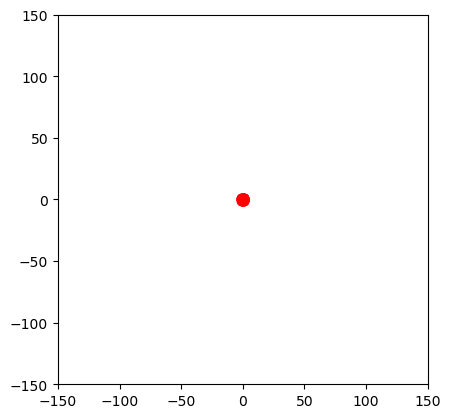

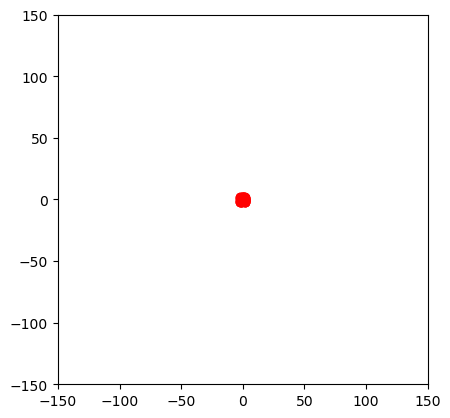

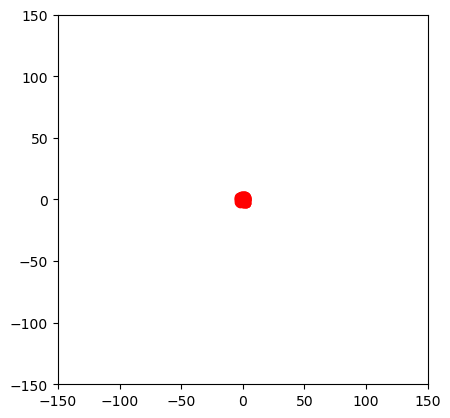

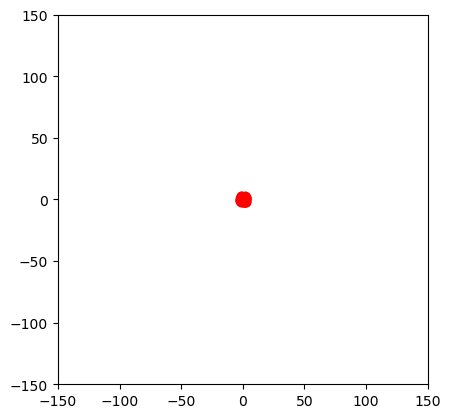

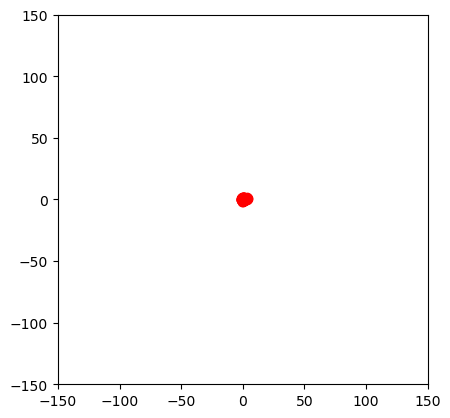

...

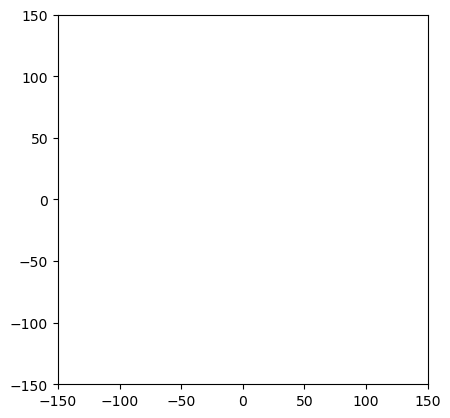

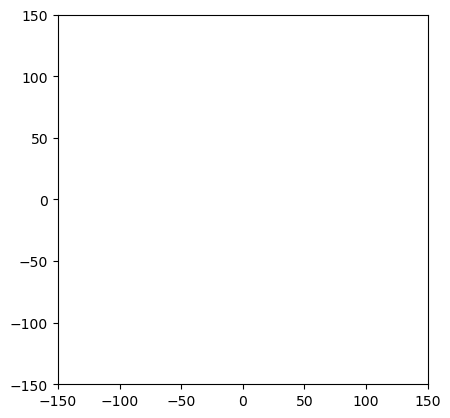

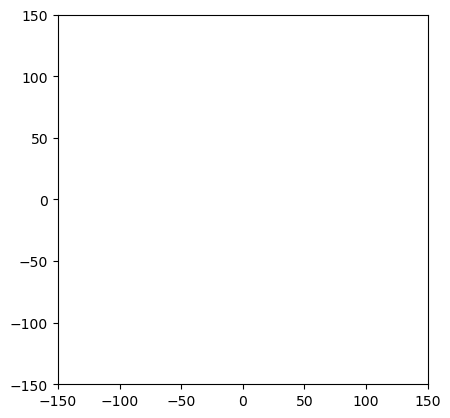

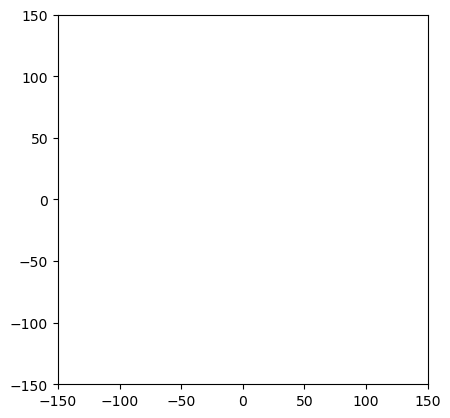

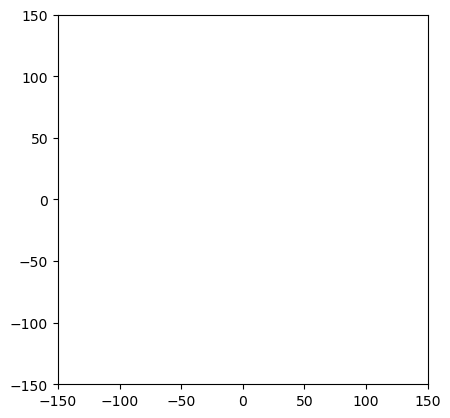

In [1]:
import random as rd
import pylab as py

n = 100 # number of agents

class agent:
    pass

def initialise():
    """
    Info part comes into this docstring
    """
    global agents, n 
    agents = []
    for i in range(n):
        ag = agent()
        ag.x = rd.uniform(-1,1) # select x and y values: random number between (-1,1)
        ag.y = rd.uniform(-1,1) 
        ag.newx = 0 # # we need to store two positions: current and previous 
        ag.newy = 0
        agents.append(ag)
    
def observe():
    global agents
    py.cla()   
    py.plot([ag.x for ag in agents], [ag.y for ag in agents], 'ro')
    py.axis('image')
    py.axis([-150, 150, -150, 150])
  
def update():
    global agents
    Cx = py.mean([ag.x for ag in agents]) # centre C of swarm in x and y
    Cy = py.mean([ag.y for ag in agents])
    xnoise = py.uniform(-50, 50)
    ynoise = py.uniform(-50, 50)
    
    for ag in agents:
        ag.newx = 2*ag.x - ag.newx + 1.5*(Cx - ag.x)/py.norm(Cx - ag.x)  # acceleration the swarm center
        # 2ag is: current value (=ag) + variation (=ag - agnew) 
        # norm removes minus sign; term is a restoring force
        ag.newy = 2*ag.y - ag.newy + 1.5*(Cy - ag.y)/py.norm(Cy - ag.y) 
        # now we need to update ag.x, that becomes 
        # the calculated ag.new; and then ag.new 
        # becomes the old ag.x (which is stored for next round)
        ag.x, ag.newx = ag.newx, ag.x 
        ag.y, ag.newy = ag.newy, ag.y
    

    
steps = 1000 
initialise()
fig = py.figure()
ax = fig.add_subplot(1,1,1)

observe()

for i in range(steps):    

    ax.clear()
    update()
    observe()
    py.pause(0.01)
    
#import PyQt6.QtCore
#import os
#os.environ["QT_API"] = "pyqt5"
#import pycxsimulator
#pycxsimulator.GUI().start(func=[initialise, observe, update])


#import simulate_ABM as sim
#steps = 1000
#animation_name = f"Simulations/Flocking_{n}n_{steps}steps"

#sim.mp4_animation(steps, animation_name, initialise, update, observe)



In [ ]:
rd.uniform(-1,1) 
py.norm(-3)

Exercise 1

This code updates the position of agents in lines 33 and 36: <br>
ag.newx = 2*ag.x - ag.newx + 0.2*(Cx - ag.x)/py.norm(Cx -ag.x) 

a) Vary the restoring parameter 0.5. What happens?

b) Try sample sizes of 20, 50, 200.  


Exercise 2

The code is very simple but already presents swarm-like behaviour.
Which are the obvious limitations?

How could you modify the code to make sure the swarm never flies away from the plot?? 

What could make the swarm simulation more realistic? Is there anything swarming that birds do that the current code doesn’t represent? How would you implement the changes?

See an example of modified code below. What is it doing differently?

In [21]:
import random as rd
import pylab as py

n = 150 # number of agents

class agent:
    pass

def initialise():
    global agents    
    agents = []
    for i in range(n):
        ag = agent()
        ag.x = rd.uniform(-1, 1) 
        ag.y = rd.uniform(-1, 1) 
        #ag.randx = rd.uniform(-1,1)
        #ag.randy = rd.uniform(-1, 1)*(1**2 - ag.randx**2)**0.5
        ag.newx = 0 # we need to store two positions: current and previous
        ag.newy = 0
        agents.append(ag)
   
def observe():
    global agents
    py.cla()   
    py.plot([ag.x for ag in agents], [ag.y for ag in agents], 'bo')
    #red = [ag for ag in agents if ag.type == 0]
    #blue = [ag for ag in agents if ag.type == 1]
    #py.plot([ag.x for ag in red], [ag.y for ag in red], 'go', markersize=3)
    #py.plot([ag.x for ag in blue], [ag.y for ag in blue], 'bo', markersize=3)    
    py.axis('image')
    py.axis([-50, 50, -50, 50])
  
def update():
    global agents
    Cx = py.mean([ag.x for ag in agents]) #+ 0.1*rd.gauss(0,1)
    Cy = py.mean([ag.y for ag in agents]) #+ 0.1*rd.gauss(0,1)
    xnoise = py.uniform(-50, 50) #picks random point in grid
    ynoise = py.uniform(-50, 50)
    
    for ag in agents:
        #neighbours = [nb for nb in agents
        #             if (ag.x - nb.x)**2 + (ag.y - nb.y)**2 < r**2 and nb != ag]
        #cx = py.mean([ag.x for nb in neighbours])
        #cy = py.mean([ag.y for nb in neighbours])
        #if ag.type == 1:
        ag.newx = 2*ag.x - ag.newx \
            + 0.2*(Cx - ag.x)/py.norm(Cx - ag.x) \
            + 0.1*(xnoise-ag.x)/py.norm(xnoise-ag.x)    
        ag.newy = 2*ag.y - ag.newy \
            + 0.2*(Cy - ag.y)/py.norm(Cy - ag.y) \
            + 0.1*(ynoise-ag.y)/py.norm(ynoise-ag.y)    
                
        #else:
         #   ag.newx = 2*ag.x - ag.newx + 0.2*(Cx - ag.x)/py.norm(Cx - ag.x) 
          #  ag.newy = 2*ag.y - ag.newy + 0.2*(Cy - ag.y)/py.norm(Cy - ag.y) 
        ag.x, ag.newx = ag.newx, ag.x
        ag.y, ag.newy = ag.newy, ag.y
    

import pycxsimulator
pycxsimulator.GUI().start(func=[initialise, observe, update])



In [ ]:
rd.uniform(-1,1)